# WFI2033 data_visullization multimass

读取 WFI2033 multimass HMC 结果并可视化：
- Trace plot
- Corner plot
- Data / Model / Residual / Source（含 source-plane AGN 位置）
- Lens-light-subtracted data 保存


In [12]:
import os
os.environ["JAX_PLATFORMS"] = "cpu"
os.environ["CUDA_VISIBLE_DEVICES"] = ""
os.environ.setdefault("HDF5_USE_FILE_LOCKING", "FALSE")

import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import sys

import arviz as az
import corner
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import numpyro
import xarray as xr
from tqdm.auto import tqdm
from astropy.io import fits

jax.config.update("jax_enable_x64", True)
numpyro.enable_x64()

# Ensure local WFI2033 modules are importable
if str(Path.cwd()) not in sys.path:
    sys.path.append(str(Path.cwd()))

from herculens_import_main import (
    get_pixel_grid,
    trace_current_agn_to_source,
    params2kwargs_EPL_w_shear,
    params2kwargs_SIS,
    params2kwargs_multi_gauss_light,
)
from herculens.Instrument.noise import Noise
from herculens.Instrument.psf import PSF
from herculens.MassModel.mass_model import MassModel
from herculens.LightModel.light_model import LightModel
from herculens.PointSourceModel.point_source_model import PointSourceModel
from lens_images_extension import LensImageExtension, pixelize_plane as pixelize_plane_single
from herculens.Util import model_util


In [13]:
suffix = '_ss=2_fullconcen_light_multimass'
OUTPUT_ROOT = Path('/mnt/lustre/tianli/quasar_hmc')


In [14]:
DATA_DIR = Path('../../Data/WFI2033')
RAW_DATA_PATH = DATA_DIR / 'jw01198-o004_t004_nircam_clear-f115w_i2d.fits'
MASK_PATH = 'data/mask_hmc.fits'
MASK_OUT_PATH = DATA_DIR / 'mask_out_center.fits'

run_tag = '20260427_14'
RUN_OUTPUT_DIR = OUTPUT_ROOT / f'WFI2033{suffix}_{run_tag}'
products_root = Path('./result') / f'result{suffix}_{run_tag}'
products_dir = products_root / 'data_products'
NC_PATH = RUN_OUTPUT_DIR / f'WFI2033_all{suffix}.nc'
HMC_MEDIAN_PATH = products_root / f'HMC_median_draw{suffix}.nc'

print('RUN_OUTPUT_DIR =', RUN_OUTPUT_DIR)
print('products_dir =', products_dir)
print('HMC_MEDIAN_PATH =', HMC_MEDIAN_PATH)

with fits.open(RAW_DATA_PATH, memmap=True) as hdul_raw:
    raw_header = hdul_raw['SCI'].header if 'SCI' in hdul_raw else hdul_raw[0].header
    exposure_time = float(raw_header.get('EXPTIME', raw_header.get('TEXPTIME', raw_header.get('XPOSURE', 1.0))))
pix_scale = float(np.sqrt(raw_header['PIXAR_A2']))

data = np.array(fits.getdata(products_dir / f'data_bkg_sub{suffix}.fits'), dtype=float)
rms_file = np.array(fits.getdata(products_dir / f'rms_with_psf_extra{suffix}.fits'), dtype=float)
fixed_first_three = np.load(RUN_OUTPUT_DIR / f'fixed_first_three_gaussians{suffix}.npz')
fixed_first_three_psf = np.array(fits.getdata(products_dir / f'fixed_first_three_psf{suffix}.fits'), dtype=float)
PSF_BASE_DISPLAY_PATH = Path('./psf_data/PSF_model_step3_svi_ss1_from_ss3.fits')
with fits.open(PSF_BASE_DISPLAY_PATH, memmap=True) as hdul_psf_display:
    psf_base = np.array(hdul_psf_display['DET_PSF_MODEL'].data if 'DET_PSF_MODEL' in hdul_psf_display else hdul_psf_display[0].data, dtype=float)
mask = np.array(fits.getdata(MASK_PATH), dtype=bool)
mask_out = np.array(fits.getdata(MASK_OUT_PATH), dtype=bool)
mask = mask_out.copy()

ny, nx = mask_out.shape
xc, yc = nx / 2, ny / 2
r = 16

y, x = jnp.indices((ny, nx))
circle = (x - xc) ** 2 + (y - yc) ** 2 <= r ** 2
mask_out = jnp.logical_or(mask_out, circle)

valid = jnp.isfinite(data) & jnp.isfinite(rms_file) & (rms_file > 0)
mask = mask & valid

fixed_first_three_psf = np.clip(fixed_first_three_psf, 0.0, None)
fixed_first_three_psf = fixed_first_three_psf / np.sum(fixed_first_three_psf)
psf_base = np.clip(psf_base, 0.0, None)
psf_base = psf_base / np.sum(psf_base)
fixed_kwargs_lens_light_first_three = [{
    'amp': np.asarray(fixed_first_three['amp'], dtype=float),
    'sigma': np.asarray(fixed_first_three['sigma'], dtype=float),
    'e1': np.asarray(fixed_first_three['e1'], dtype=float),
    'e2': np.asarray(fixed_first_three['e2'], dtype=float),
    'center_x': np.asarray(fixed_first_three['center_x'], dtype=float),
    'center_y': np.asarray(fixed_first_three['center_y'], dtype=float),
}]

inf_data_pixel = az.from_netcdf(str(NC_PATH))
post = inf_data_pixel.posterior
HMC_median = xr.load_dataset(HMC_MEDIAN_PATH)
num_chains = int(post.sizes['chain'])
source_grid_scale = 0.8

conj_points = jnp.array([
    [1.20212170716053, -0.12271885209256231],
    [0.9053233071260114, 0.5277189685977776],
    [-1.0461673774453952, 1.0081083299749878],
    [-0.1255456241215261, -0.8965524340129204],
])

G1_MASS_CENTER = (1.556, 1.299)
G2_MASS_CENTER = (2.145, -3.326)
G3_MASS_CENTER = (4.243403, 6.185564)
G7_MASS_CENTER = (-7.284665, -10.319681)

pixel_grid, xgrid, ygrid, x_axis, y_axis, extent, nx, ny = get_pixel_grid(jnp.array(data), pix_scale)


RUN_OUTPUT_DIR = /mnt/lustre/tianli/quasar_hmc/WFI2033_ss=2_fullconcen_light_multimass_20260427_14
products_dir = result/result_ss=2_fullconcen_light_multimass_20260427_14/data_products
HMC_MEDIAN_PATH = result/result_ss=2_fullconcen_light_multimass_20260427_14/HMC_median_draw_ss=2_fullconcen_light_multimass.nc


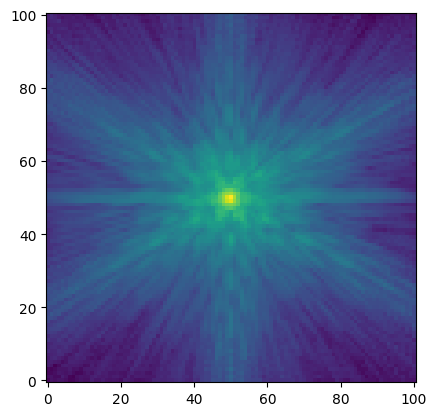

In [15]:
plt.imshow(psf_base, norm = 'log')

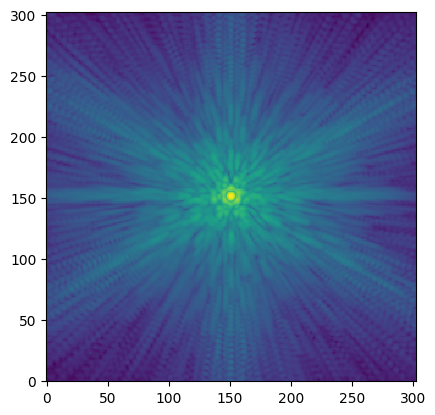

In [16]:
stpsf = fits.getdata('psf_data/F115W_PSF_stpsf_ss3.fits')
plt.imshow(stpsf, norm = 'log')

In [17]:
# Build LensImage object (pixelated source) for forward model visualization
noise = Noise(nx, ny, exposure_time=exposure_time)
psf_obj = PSF(psf_type='PIXEL', kernel_point_source=psf_base)

mass_model_pixel = MassModel(['EPL', 'SHEAR', 'SIS', 'SIS', 'SIS', 'SIS'])
lens_light_model_pixel = LightModel(['MULTI_GAUSSIAN_ELLIPSE'], {})

pixel_grid_shape = int(post['pixels_source_grid'].shape[-1])

source_light_model_pixel = LightModel(
    ['PIXELATED'],
    pixel_adaptive_grid=True,
    pixel_interpol='fast_bilinear',
    kwargs_pixelated={'num_pixels': pixel_grid_shape},
)

point_source_model_pixel = PointSourceModel(
    ['IMAGE_POSITIONS'],
    mass_model=mass_model_pixel,
    image_plane=pixel_grid,
)

lens_image_pixel = LensImageExtension(
    pixel_grid,
    psf_obj,
    noise_class=noise,
    lens_light_model_class=lens_light_model_pixel,
    lens_mass_model_class=mass_model_pixel,
    source_model_class=source_light_model_pixel,
    point_source_model_class=point_source_model_pixel,
    source_arc_mask=jnp.array(mask),
    conjugate_points=conj_points,
    kwargs_numerics={'supersampling_factor': 1},
    source_grid_scale=source_grid_scale,
)


In [18]:


model_image_med = np.array(HMC_median['model_image'].values)
psf_corr_med = np.array(HMC_median['psf_kernel_corrected'].values)
psf_corr_med = np.clip(psf_corr_med, 0.0, None)
psf_corr_med = psf_corr_med / np.sum(psf_corr_med, axis=(1, 2), keepdims=True)


def _chain_param_dict(i: int):
    keys = [
        'theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1',
        'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7',
        'amp_lens', 'sigma_lens', 'e_lens', 'center_lens',
        'pixels_source_grid', 'ra_ps', 'dec_ps', 'log10_amp_ps',
    ]
    p = {k: np.array(HMC_median[k].isel(chain=i).values) for k in keys}

    p['center_1_g1'] = np.array([G1_MASS_CENTER[0]], dtype=float)
    p['center_2_g1'] = np.array([G1_MASS_CENTER[1]], dtype=float)
    p['center_1_g2'] = np.array([G2_MASS_CENTER[0]], dtype=float)
    p['center_2_g2'] = np.array([G2_MASS_CENTER[1]], dtype=float)
    p['center_1_g3'] = np.array([G3_MASS_CENTER[0]], dtype=float)
    p['center_2_g3'] = np.array([G3_MASS_CENTER[1]], dtype=float)
    p['center_1_g7'] = np.array([G7_MASS_CENTER[0]], dtype=float)
    p['center_2_g7'] = np.array([G7_MASS_CENTER[1]], dtype=float)
    return p


def fixed_sis_from_theta_E(theta_E, origin):
    return [{
        'theta_E': theta_E,
        'center_x': origin[0],
        'center_y': origin[1],
    }]


def params_2_kwargs(params: dict):
    theta_E_g1 = np.asarray(params['theta_E_g1']).reshape(-1)[0]
    theta_E_g2 = np.asarray(params['theta_E_g2']).reshape(-1)[0]
    theta_E_g3 = np.asarray(params['theta_E_g3'])
    theta_E_g7 = np.asarray(params['theta_E_g7'])

    kwargs_lens = (
        params2kwargs_EPL_w_shear(params, '1')
        + fixed_sis_from_theta_E(theta_E_g1, G1_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g2, G2_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g3, G3_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g7, G7_MASS_CENTER)
    )

    return {
        'kwargs_lens': kwargs_lens,
        'kwargs_lens_light': params2kwargs_multi_gauss_light(params, 'lens'),
        'kwargs_source': [{'pixels': np.asarray(params['pixels_source_grid'])}],
        'kwargs_point_source': [{
            'ra': np.asarray(params['ra_ps']),
            'dec': np.asarray(params['dec_ps']),
            'amp': np.power(10.0, np.asarray(params['log10_amp_ps'])),
        }],
    }


kwargs_chains = [params_2_kwargs(_chain_param_dict(i)) for i in range(num_chains)]


In [19]:
# Fermat-potential differences from posterior samples
# Loop over draw for memory control, and vmap only over the chain axis.
# Optional subsampling: if max_draws_per_chain is set, randomly draw that many samples per chain.

posterior_keys = [
    'theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1',
    'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7', 'ra_ps', 'dec_ps',
]
posterior_arrays_full = {k: jnp.asarray(post[k].values) for k in posterior_keys}

max_draws_per_chain = 1000
rng_subsample = np.random.default_rng(12345)

n_draws_full = int(post.sizes['draw'])
if max_draws_per_chain is None or max_draws_per_chain >= n_draws_full:
    draw_indices = np.arange(n_draws_full, dtype=int)
else:
    draw_indices = np.sort(rng_subsample.choice(n_draws_full, size=max_draws_per_chain, replace=False))

posterior_arrays = {k: v[:, draw_indices, ...] for k, v in posterior_arrays_full.items()}
post_for_fpd = post.isel(draw=draw_indices)

chain_in_axes = {k: 0 for k in posterior_keys}

def fixed_sis_from_theta_E(theta_E, origin):
    return [{
        'theta_E': theta_E,
        'center_x': origin[0],
        'center_y': origin[1],
    }]

def compute_fpd_single(params_i):
    params_i = dict(params_i)
    theta_E_g1 = params_i['theta_E_g1'][0]
    theta_E_g2 = params_i['theta_E_g2'][0]
    theta_E_g3 = params_i['theta_E_g3']
    theta_E_g7 = params_i['theta_E_g7']

    kwargs_lens_i = (
        params2kwargs_EPL_w_shear(params_i, '1')
        + fixed_sis_from_theta_E(theta_E_g1, G1_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g2, G2_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g3, G3_MASS_CENTER)
        + fixed_sis_from_theta_E(theta_E_g7, G7_MASS_CENTER)
    )
    fermat_i = mass_model_pixel.fermat_potential(
        params_i['ra_ps'],
        params_i['dec_ps'],
        kwargs_lens_i,
    )
    return jnp.array([
        fermat_i[2] - fermat_i[0],
        fermat_i[2] - fermat_i[1],
        fermat_i[2] - fermat_i[3],
    ])

compute_fpd_chain = jax.vmap(compute_fpd_single, in_axes=(chain_in_axes,))

n_draws = int(len(draw_indices))
fpd_values = np.empty((num_chains, n_draws, 3), dtype=float)
for draw_i in tqdm(range(n_draws), desc='Computing fpd_31, fpd_32, fpd_34 over draws'):
    params_draw_i = {k: posterior_arrays[k][:, draw_i, ...] for k in posterior_keys}
    fpd_values[:, draw_i, :] = np.asarray(jax.device_get(compute_fpd_chain(params_draw_i)), dtype=float)

post_with_fpd = post_for_fpd.assign(
    fpd_31=(("chain", "draw"), fpd_values[:, :, 0]),
    fpd_32=(("chain", "draw"), fpd_values[:, :, 1]),
    fpd_34=(("chain", "draw"), fpd_values[:, :, 2]),
)

print('Added posterior variables: fpd_31, fpd_32, fpd_34')
print('draw_indices shape:', draw_indices.shape)
print('fpd_values shape:', fpd_values.shape)
print('fpd_31 median by chain:', np.median(fpd_values[:, :, 0], axis=1))
print('fpd_32 median by chain:', np.median(fpd_values[:, :, 1], axis=1))
print('fpd_34 median by chain:', np.median(fpd_values[:, :, 2], axis=1))


Computing fpd_31, fpd_32, fpd_34 over draws:   0%|          | 0/1000 [00:00<?, ?it/s]

Added posterior variables: fpd_31, fpd_32, fpd_34
draw_indices shape: (1000,)
fpd_values shape: (8, 1000, 3)
fpd_31 median by chain: [-0.30519509 -0.30524314 -0.30476674 -0.30472476 -0.30480334 -0.30481201
 -0.30497309 -0.30470973]
fpd_32 median by chain: [-0.32537803 -0.32523224 -0.32443951 -0.32467629 -0.32476397 -0.32456304
 -0.32535745 -0.3250924 ]
fpd_34 median by chain: [-0.46622304 -0.46610689 -0.46603579 -0.46568177 -0.46583865 -0.46582037
 -0.46586223 -0.46597392]


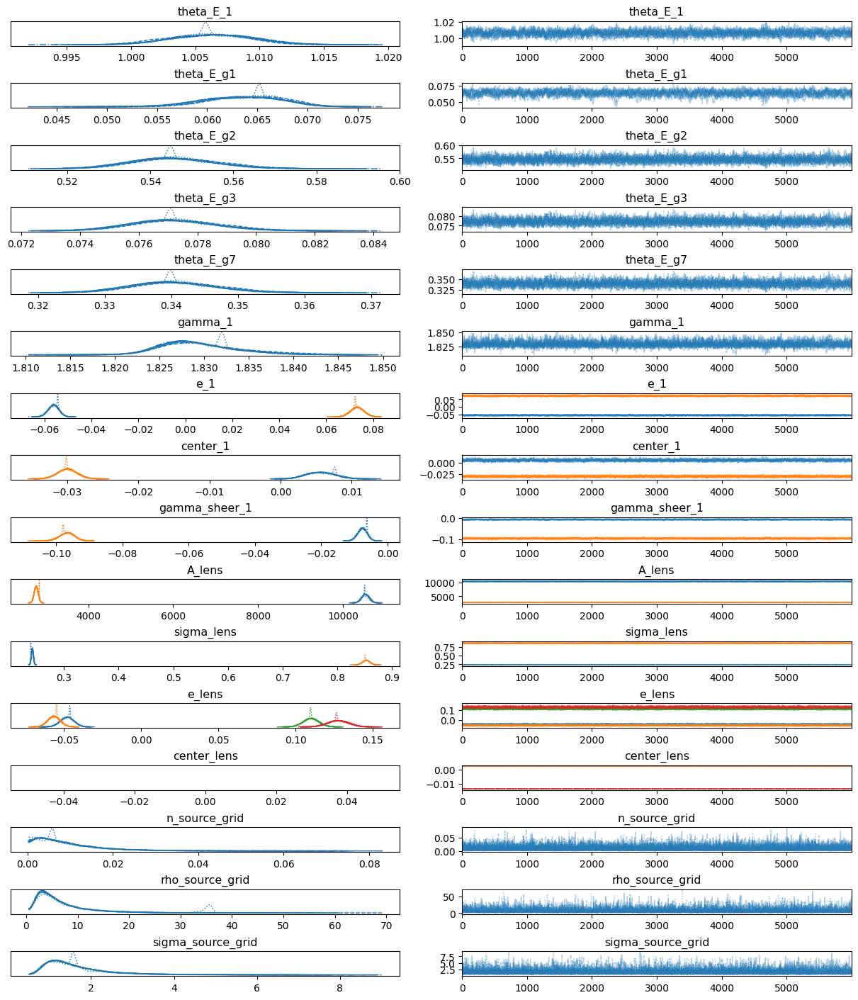

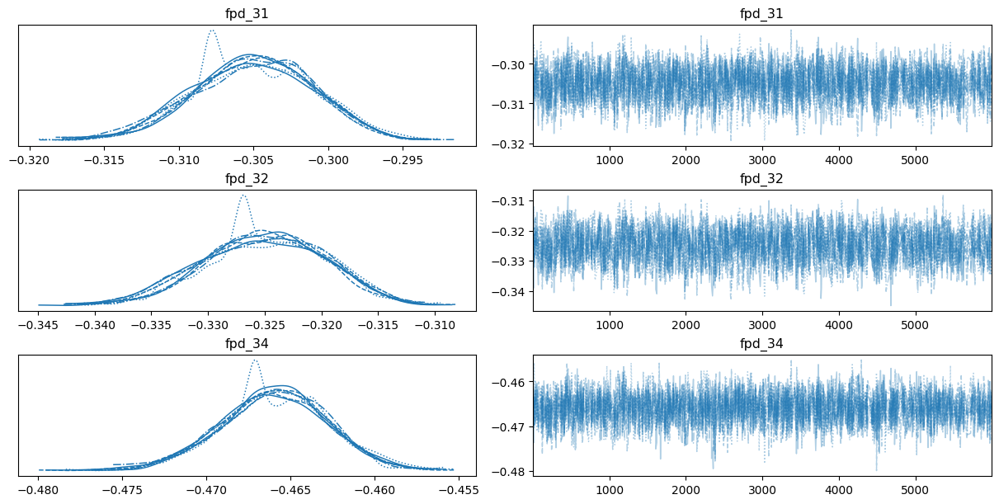

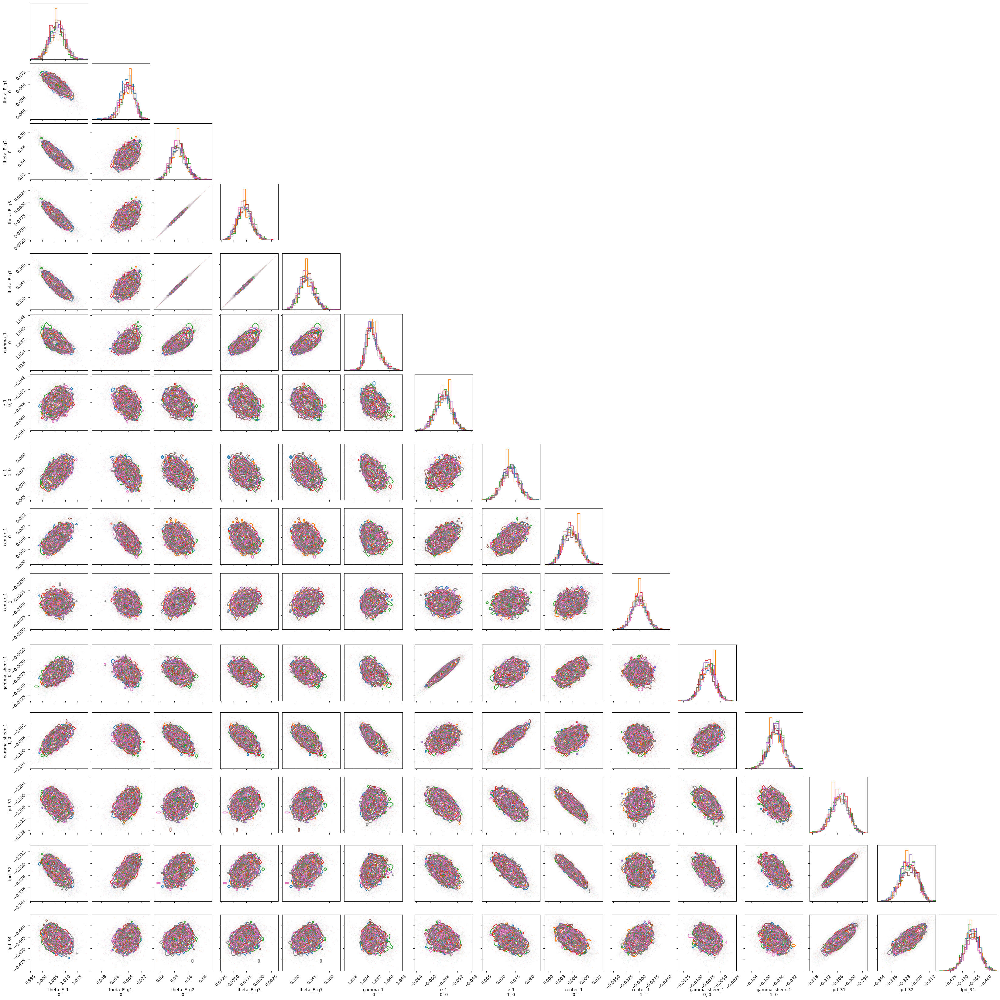

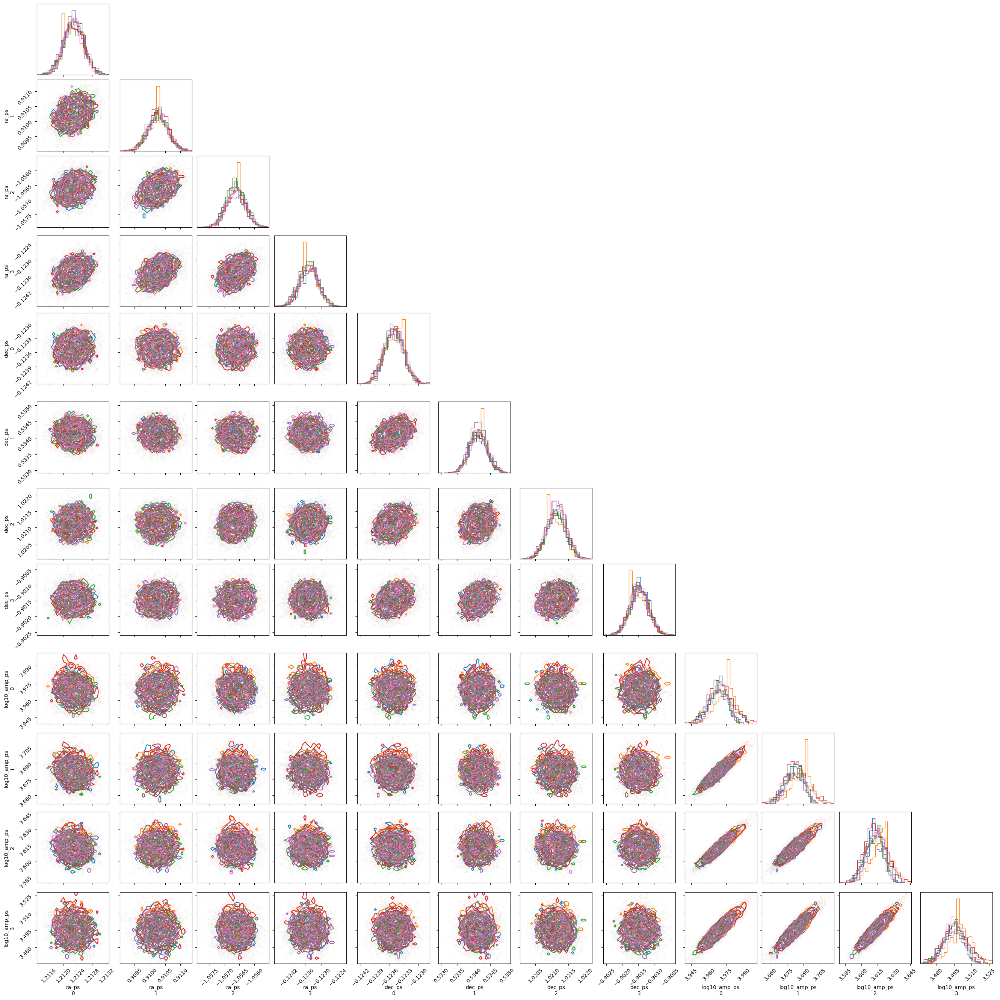

In [20]:
# Trace + corner diagnostics
vars_mass = ['theta_E_1', 'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_light = ["A_lens", "sigma_lens", "e_lens", "center_lens"]
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
vars_mass_corner = vars_mass + ['fpd_31', 'fpd_32', 'fpd_34']

plt.rcParams['figure.constrained_layout.use'] = True
_ = az.plot_trace(
    inf_data_pixel,
    var_names=vars_mass + vars_light + vars_power,
    figsize=(12, 14),
    divergences=True
)
plt.show()

_ = az.plot_trace(
    post_with_fpd,
    var_names=['fpd_31', 'fpd_32', 'fpd_34'],
    figsize=(12, 6),
)
plt.show()

fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post_with_fpd.isel(chain=i),
        var_names=vars_mass_corner,
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()

fig_corner = None
for i in range(num_chains):
    fig_corner = corner.corner(
        post_for_fpd.isel(chain=i),
        var_names=['ra_ps', 'dec_ps', 'log10_amp_ps'],
        color=f'C{i}',
        fig=fig_corner,
    )
plt.show()


In [21]:
div = inf_data_pixel.sample_stats['diverging']
if div.dims == ('chain', 'draw', 'diverging_dim_0'):
    div_counts = np.asarray(div.sum(dim='draw').values, dtype=int)
    print('divergences per chain:')
    print(f'  block 0 (main mass/source/lens-light/AGN): {div_counts[:, 0]}')
    print(f'  block 1 (psf correction): {div_counts[:, 1]}')
else:
    print('divergences per chain:')
    print(np.asarray(div.sum(dim='draw').values, dtype=int))

az.summary(post_with_fpd.isel(chain=list(range(num_chains))), var_names=vars_mass_corner + vars_power)


divergences per chain:
  block 0 (main mass/source/lens-light/AGN): [341 741 128 333  96  24 189 194]
  block 1 (psf correction): [0 0 0 0 0 0 0 0]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta_E_1[0],1.006,0.003,1.000,1.012,0.000,0.000,1220.0,2299.0,1.01
theta_E_g1[0],0.063,0.004,0.057,0.071,0.000,0.000,939.0,1561.0,1.01
theta_E_g2[0],0.545,0.010,0.527,0.565,0.000,0.000,1910.0,3678.0,1.01
theta_E_g3,0.077,0.001,0.075,0.080,0.000,0.000,1910.0,3678.0,1.01
theta_E_g7,0.340,0.006,0.329,0.352,0.000,0.000,1910.0,3678.0,1.01
gamma_1[0],1.829,0.004,1.822,1.838,0.000,0.000,2243.0,3439.0,1.00
"e_1[0, 0]",-0.056,0.002,-0.060,-0.052,0.000,0.000,2078.0,3575.0,1.00
"e_1[1, 0]",0.073,0.003,0.068,0.079,0.000,0.000,2003.0,4413.0,1.00
center_1[0],0.006,0.002,0.002,0.009,0.000,0.000,1265.0,2774.0,1.00
center_1[1],-0.030,0.001,-0.033,-0.027,0.000,0.000,3608.0,5303.0,1.00


In [22]:
for name in ['fpd_31', 'fpd_32', 'fpd_34']:
    fpd_samples = post_with_fpd[name].isel(chain=list(range(min(num_chains, 5)))).values.flatten()
    p16, p50, p84 = np.percentile(fpd_samples, [16, 50, 84])
    err_minus = p50 - p16
    err_plus = p84 - p50
    print(f'{name} = {p50:.4f} - {err_minus:.4f} + {err_plus:.4f}')


fpd_31 = -0.3050 - 0.0038 + 0.0040
fpd_32 = -0.3249 - 0.0053 + 0.0054
fpd_34 = -0.4659 - 0.0031 + 0.0031


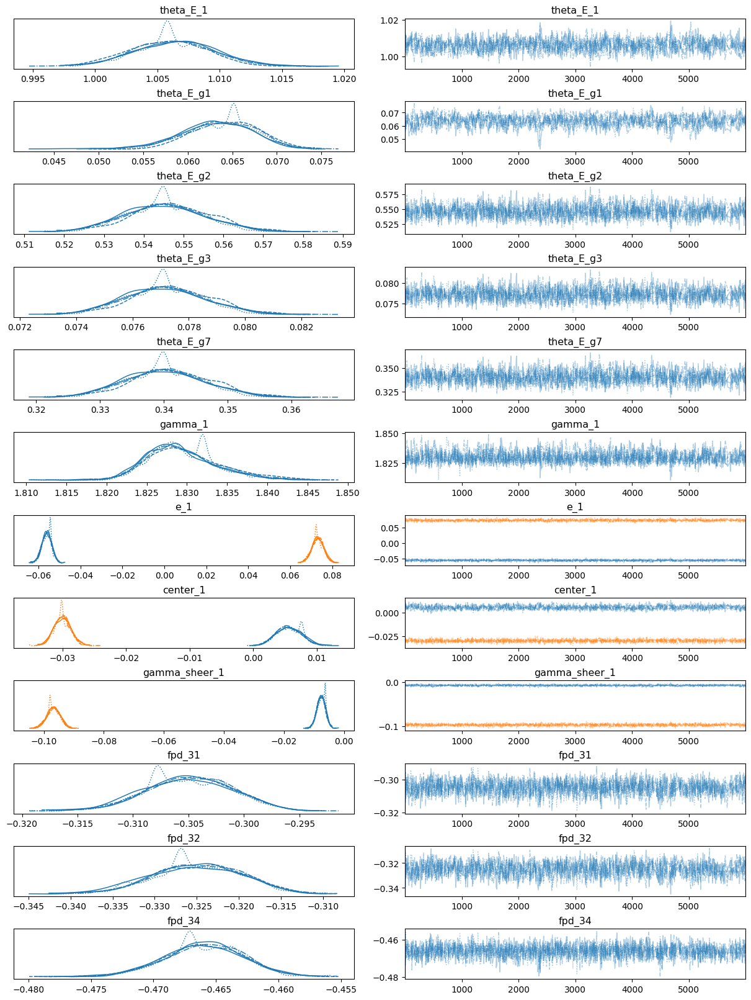

In [23]:
plt.rcParams['figure.constrained_layout.use'] = True
_ = az.plot_trace(
    post_with_fpd.isel(chain=list(range(min(num_chains, 5)))),
    var_names=vars_mass + ['fpd_31', 'fpd_32', 'fpd_34'],
    figsize=(12, 16),
)
plt.show()


In [24]:
az.summary(post_with_fpd.isel(chain=list(range(5))), var_names=vars_mass_corner + vars_power)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta_E_1[0],1.006,0.003,1.000,1.012,0.000,0.000,757.0,1415.0,1.01
theta_E_g1[0],0.064,0.004,0.057,0.071,0.000,0.000,607.0,1000.0,1.01
theta_E_g2[0],0.546,0.010,0.527,0.565,0.000,0.000,1169.0,2317.0,1.01
theta_E_g3,0.077,0.001,0.075,0.080,0.000,0.000,1169.0,2317.0,1.01
theta_E_g7,0.340,0.006,0.329,0.352,0.000,0.000,1169.0,2317.0,1.01
gamma_1[0],1.829,0.005,1.822,1.838,0.000,0.000,1374.0,1989.0,1.00
"e_1[0, 0]",-0.056,0.002,-0.060,-0.052,0.000,0.000,1485.0,2627.0,1.00
"e_1[1, 0]",0.073,0.003,0.068,0.079,0.000,0.000,1273.0,2604.0,1.00
center_1[0],0.006,0.002,0.002,0.009,0.000,0.000,845.0,1904.0,1.00
center_1[1],-0.030,0.001,-0.033,-0.028,0.000,0.000,2564.0,3322.0,1.00


In [25]:

# Visualization style helpers matched to Step_5_full_lenslight_multimass.ipynb
mask_plot = np.array(mask_out, dtype=bool)
rms_safe = np.array(rms_file, dtype=float)


def mask_axis_limits(mask_bool, extent, pad_pixels=5):
    yy, xx = np.where(np.asarray(mask_bool, dtype=bool))
    if len(xx) == 0 or len(yy) == 0:
        return (extent[0], extent[1]), (extent[2], extent[3])
    ny_, nx_ = mask_bool.shape
    dx = (extent[1] - extent[0]) / nx_
    dy = (extent[3] - extent[2]) / ny_
    x0 = max(int(xx.min()) - pad_pixels, 0)
    x1 = min(int(xx.max()) + 1 + pad_pixels, nx_)
    y0 = max(int(yy.min()) - pad_pixels, 0)
    y1 = min(int(yy.max()) + 1 + pad_pixels, ny_)
    return (extent[0] + x0 * dx, extent[0] + x1 * dx), (extent[2] + y0 * dy, extent[2] + y1 * dy)


mask_xlim, mask_ylim = mask_axis_limits(mask_plot, extent, pad_pixels=5)


def masked_for_display(image):
    return np.ma.array(np.asarray(image), mask=~mask_plot)


def psf_extent_arcsec(kernel, pixel_scale=pix_scale):
    ny_, nx_ = np.asarray(kernel).shape
    return [
        -0.5 * nx_ * pixel_scale,
         0.5 * nx_ * pixel_scale,
        -0.5 * ny_ * pixel_scale,
         0.5 * ny_ * pixel_scale,
    ]


def style_axis(ax, image_plane=False, title_size=17, tick_size=13):
    if image_plane:
        ax.set_xlim(*mask_xlim)
        ax.set_ylim(*mask_ylim)
    ax.tick_params(direction='in', which='both', top=True, right=True, length=4, width=0.9, labelsize=tick_size)
    ax.set_aspect('equal', adjustable='box')
    ax.title.set_fontsize(title_size)


def add_residual_colorbar(fig, ax, image):
    cbar = fig.colorbar(image, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(direction='in', which='both', labelsize=12)
    return cbar


def psf_log_norm(*kernels):
    eps = 1e-12
    vmax = np.nanmax([np.nanmax(np.asarray(k)) for k in kernels])
    return colors.LogNorm(vmin=max(vmax * 1e-6, eps), vmax=max(vmax, eps * 10))


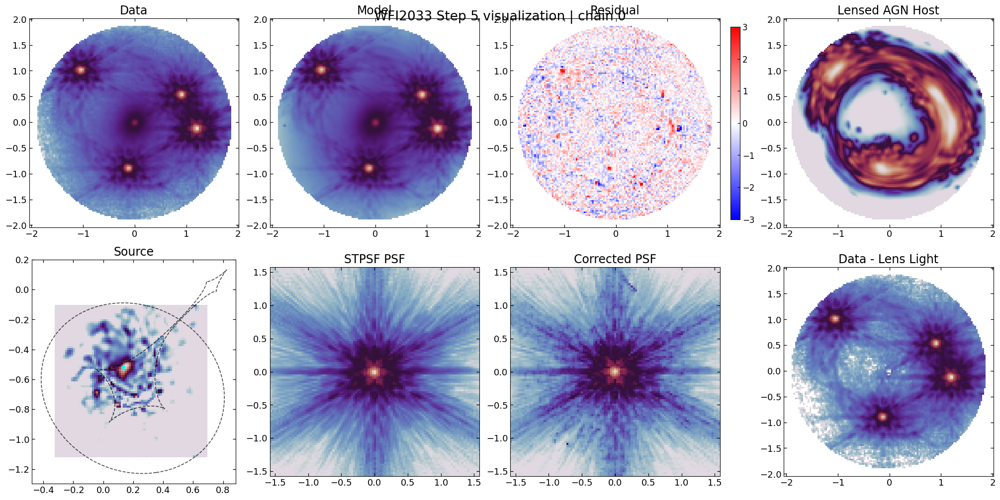

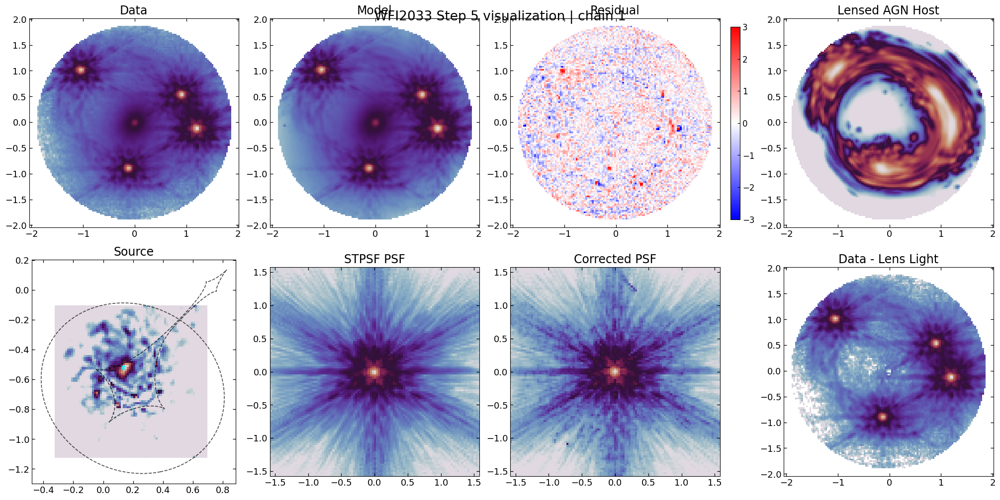

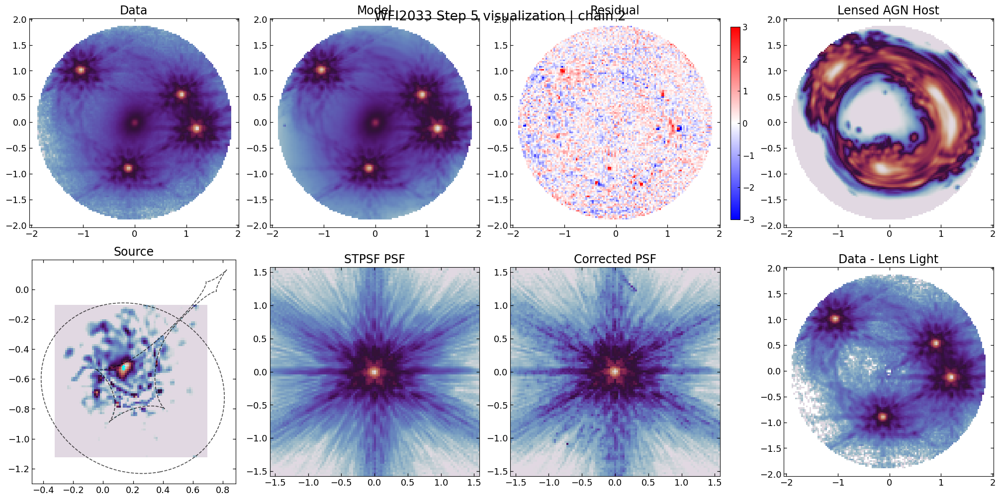

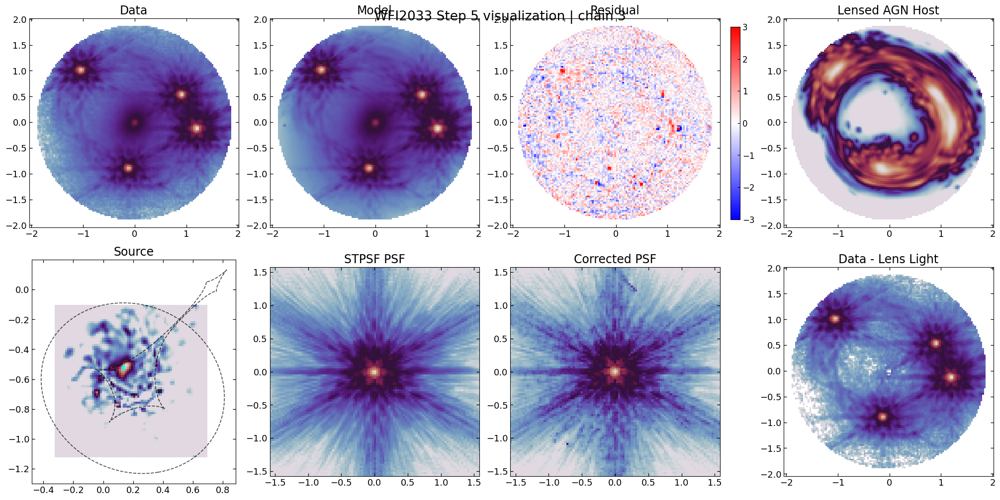

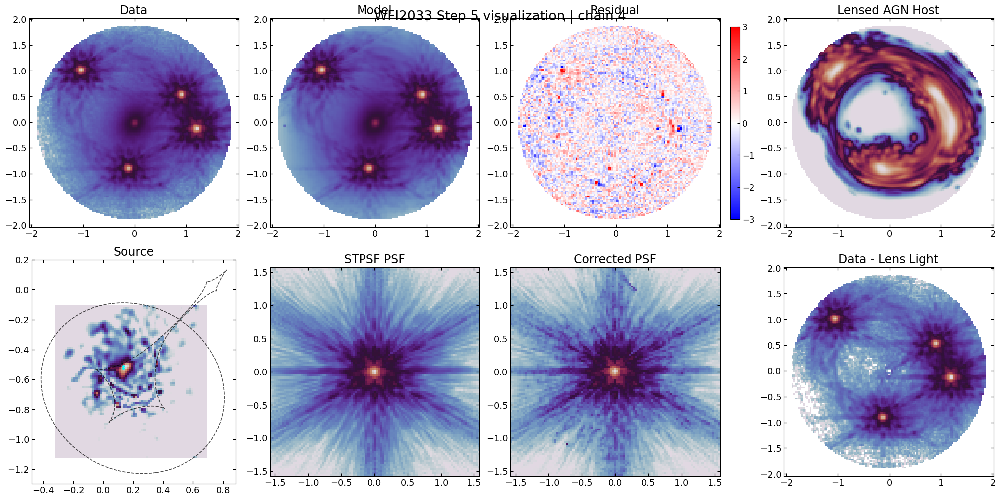

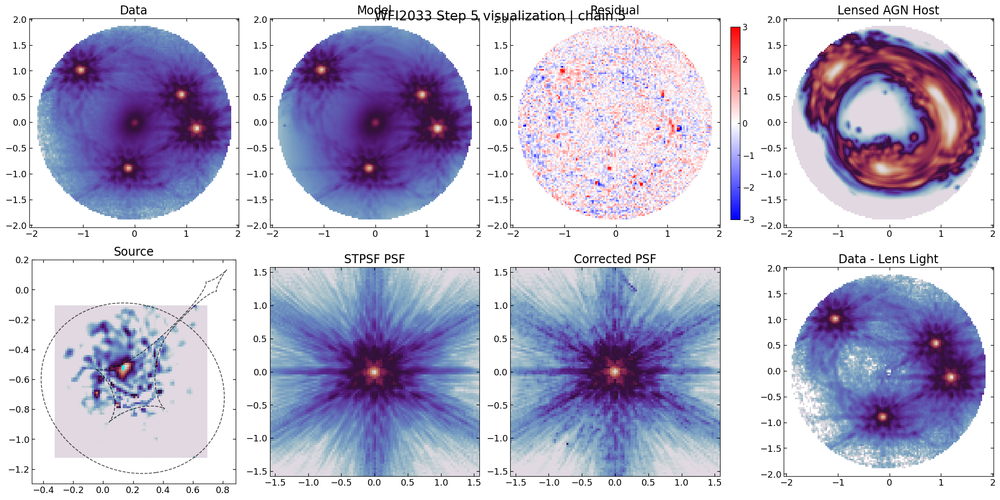

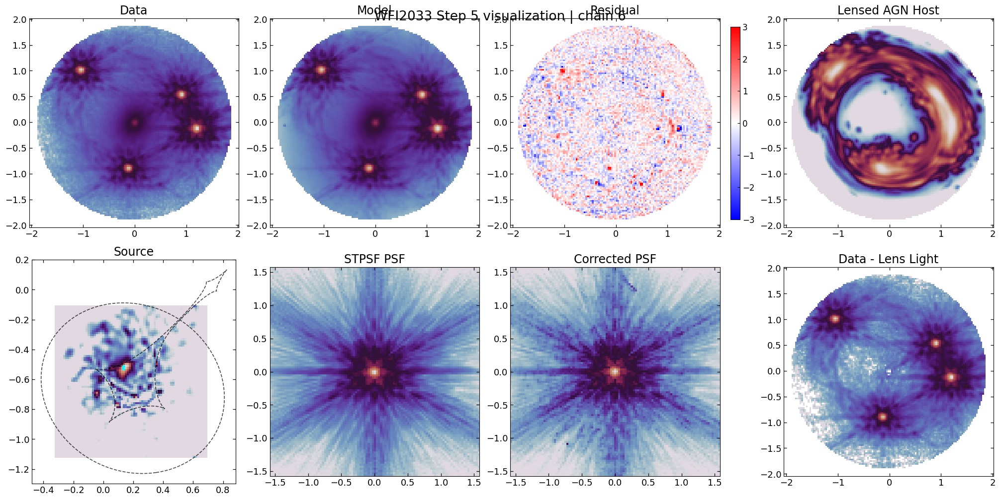

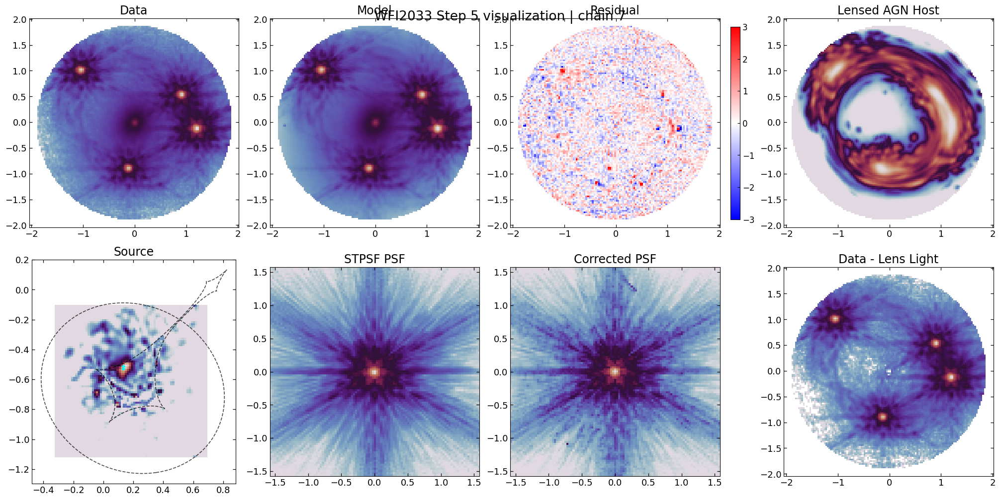

In [26]:
# Main visualization:
# row1: Data | Model | Residual | Lensed AGN Host
# row2: Source | STPSF PSF | Corrected PSF | Data - Lens Light
for i in range(num_chains):
    kwargs_i = kwargs_chains[i]
    psf_corr_i = np.array(psf_corr_med[i], dtype=float)

    model_det_i = np.array(model_image_med[i], dtype=float)
    residual_i = (data - model_det_i) / rms_safe

    model_wo_lens_light_i = np.array(
        lens_image_pixel.model(
            **kwargs_i,
            source_add=True,
            lens_light_add=False,
            point_source_add=False,
            psf_kernel=psf_corr_i,
        )
    )

    fixed_lens_light_unconv = lens_image_pixel.lens_surface_brightness(
        fixed_kwargs_lens_light_first_three,
    )
    fixed_lens_light_i = np.array(
        lens_image_pixel.ImageNumerics.re_size_convolve(
            fixed_lens_light_unconv,
            unconvolved=False,
            psf_kernel=fixed_first_three_psf,
        )
    )
    free_lens_light_i = np.array(
        lens_image_pixel.model(
            **kwargs_i,
            source_add=False,
            lens_light_add=True,
            point_source_add=False,
            psf_kernel=psf_corr_i,
        )
    )
    lens_light_only_i = fixed_lens_light_i + free_lens_light_i

    source_i, source_extent = pixelize_plane_single(
        lens_image_pixel,
        kwargs_i,
        pixel_grid_shape,
    )
    src_x, src_y = trace_current_agn_to_source(lens_image_pixel, kwargs_i)
    src_x = np.array(src_x)
    src_y = np.array(src_y)

    critical_lines_i, caustics_i = model_util.critical_lines_caustics(
        lens_image_pixel,
        kwargs_i['kwargs_lens'],
        supersampling=10,
    )

    fig, ax = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(f'WFI2033 Step 5 visualization | chain {i}', fontsize=19, y=0.98)

    ax[0, 0].imshow(masked_for_display(data), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
    ax[0, 0].set_title('Data')
    style_axis(ax[0, 0], image_plane=True)

    ax[0, 1].imshow(masked_for_display(model_det_i), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
    ax[0, 1].set_title('Model')
    style_axis(ax[0, 1], image_plane=True)

    im_res = ax[0, 2].imshow(masked_for_display(residual_i), cmap='bwr', vmin=-3, vmax=3, origin='lower', extent=extent)
    ax[0, 2].set_title('Residual')
    style_axis(ax[0, 2], image_plane=True)
    add_residual_colorbar(fig, ax[0, 2], im_res)

    ax[0, 3].imshow(masked_for_display(model_wo_lens_light_i), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
    ax[0, 3].set_title('Lensed AGN Host')
    style_axis(ax[0, 3], image_plane=True)

    ax[1, 0].imshow(np.array(source_i), cmap='twilight', origin='lower', extent=source_extent)
    for curve_x, curve_y in caustics_i:
        ax[1, 0].plot(curve_x, curve_y, color='black', linewidth=1.2, alpha=0.7, linestyle='dashed')
    ax[1, 0].scatter(src_x, src_y, s=15, facecolors='cyan', marker='+', linewidths=1.6)
    ax[1, 0].set_title('Source')
    style_axis(ax[1, 0])

    psf_norm = psf_log_norm(psf_base, psf_corr_i)
    ax[1, 1].imshow(np.clip(psf_base, 1e-12, None), cmap='twilight', norm=psf_norm, origin='lower', extent=psf_extent_arcsec(psf_base))
    ax[1, 1].set_title('STPSF PSF')
    style_axis(ax[1, 1])

    ax[1, 2].imshow(np.clip(psf_corr_i, 1e-12, None), cmap='twilight', norm=psf_norm, origin='lower', extent=psf_extent_arcsec(psf_corr_i))
    ax[1, 2].set_title('Corrected PSF')
    style_axis(ax[1, 2])

    ax[1, 3].imshow(masked_for_display(data - lens_light_only_i), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
    ax[1, 3].set_title('Data - Lens Light')
    style_axis(ax[1, 3], image_plane=True)

    # fig.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


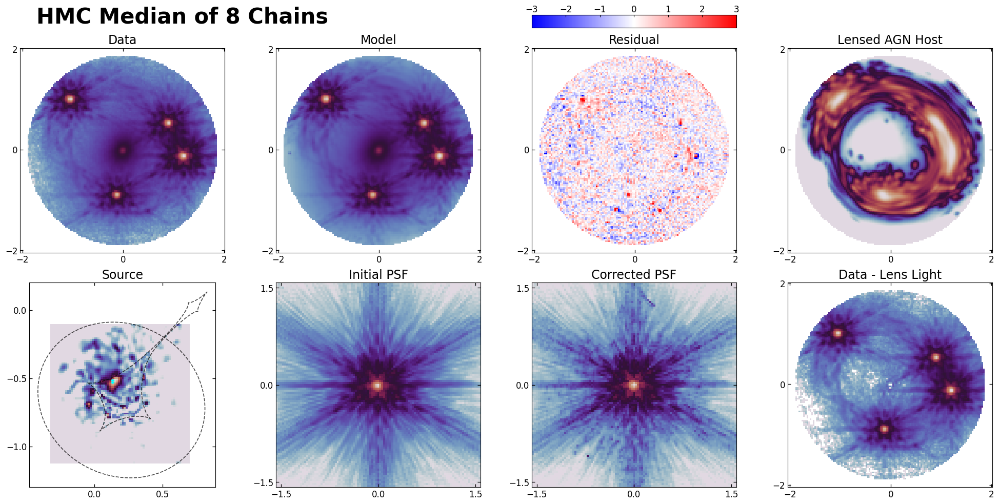

In [27]:
# Average visualization over all chains
HMC_all_chain_median = HMC_median.median(dim='chain')

model_image_avg = np.mean(model_image_med, axis=0)
psf_corr_avg = np.mean(psf_corr_med, axis=0)
psf_corr_avg = np.clip(psf_corr_avg, 0.0, None)
psf_corr_avg = psf_corr_avg / np.sum(psf_corr_avg)

params_avg = {}
for k in [
    'theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1',
    'theta_E_g1', 'theta_E_g2', 'theta_E_g3', 'theta_E_g7',
    'amp_lens', 'sigma_lens', 'e_lens', 'center_lens',
    'pixels_source_grid', 'ra_ps', 'dec_ps', 'log10_amp_ps',
]:
    params_avg[k] = np.array(HMC_all_chain_median[k].values)
params_avg['center_1_g1'] = np.array([G1_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g1'] = np.array([G1_MASS_CENTER[1]], dtype=float)
params_avg['center_1_g2'] = np.array([G2_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g2'] = np.array([G2_MASS_CENTER[1]], dtype=float)
params_avg['center_1_g3'] = np.array([G3_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g3'] = np.array([G3_MASS_CENTER[1]], dtype=float)
params_avg['center_1_g7'] = np.array([G7_MASS_CENTER[0]], dtype=float)
params_avg['center_2_g7'] = np.array([G7_MASS_CENTER[1]], dtype=float)
kwargs_avg = params_2_kwargs(params_avg)

residual_avg = (data - model_image_avg) / rms_safe

model_wo_lens_light_avg = np.array(
    lens_image_pixel.model(
        **kwargs_avg,
        source_add=True,
        lens_light_add=False,
        point_source_add=False,
        psf_kernel=psf_corr_avg,
    )
)

fixed_lens_light_unconv = lens_image_pixel.lens_surface_brightness(fixed_kwargs_lens_light_first_three)
fixed_lens_light_avg = np.array(
    lens_image_pixel.ImageNumerics.re_size_convolve(
        fixed_lens_light_unconv,
        unconvolved=False,
        psf_kernel=fixed_first_three_psf,
    )
)
free_lens_light_avg = np.array(
    lens_image_pixel.model(
        **kwargs_avg,
        source_add=False,
        lens_light_add=True,
        point_source_add=False,
        psf_kernel=psf_corr_avg,
    )
)
lens_light_avg = fixed_lens_light_avg + free_lens_light_avg

source_avg, source_extent = pixelize_plane_single(lens_image_pixel, kwargs_avg, pixel_grid_shape)
src_x_avg, src_y_avg = trace_current_agn_to_source(lens_image_pixel, kwargs_avg)
src_x_avg = np.array(src_x_avg)
src_y_avg = np.array(src_y_avg)
critical_lines_avg, caustics_avg = model_util.critical_lines_caustics(
    lens_image_pixel,
    kwargs_avg['kwargs_lens'],
    supersampling=10,
)

fig, ax = plt.subplots(2, 4, figsize=(20, 10))
fig.text(0.05, 0.955, 'HMC Median of 8 Chains', ha='left', va='center', fontsize=30, fontweight='bold')

ax[0, 0].imshow(masked_for_display(data), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
ax[0, 0].set_title('Data')
style_axis(ax[0, 0], image_plane=True)

ax[0, 1].imshow(masked_for_display(model_image_avg), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
ax[0, 1].set_title('Model')
style_axis(ax[0, 1], image_plane=True)

im_res = ax[0, 2].imshow(masked_for_display(residual_avg), cmap='bwr', vmin=-3, vmax=3, origin='lower', extent=extent)
ax[0, 2].set_title('Residual')
style_axis(ax[0, 2], image_plane=True)

ax[0, 3].imshow(masked_for_display(model_wo_lens_light_avg), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
ax[0, 3].set_title('Lensed AGN Host')
style_axis(ax[0, 3], image_plane=True)

ax[1, 0].imshow(np.array(source_avg), cmap='twilight', origin='lower', extent=source_extent)
for curve_x, curve_y in caustics_avg:
    ax[1, 0].plot(curve_x, curve_y, color='black', linewidth=1.2, alpha=0.7, linestyle='dashed')
ax[1, 0].scatter(src_x_avg, src_y_avg, s=15, facecolors='cyan', marker='+', linewidths=1.6)
ax[1, 0].set_title('Source')
style_axis(ax[1, 0])

psf_norm = psf_log_norm(psf_base, psf_corr_avg)
ax[1, 1].imshow(np.clip(psf_base, 1e-12, None), cmap='twilight', norm=psf_norm, origin='lower', extent=psf_extent_arcsec(psf_base))
ax[1, 1].set_title('Initial PSF')
style_axis(ax[1, 1])

ax[1, 2].imshow(np.clip(psf_corr_avg, 1e-12, None), cmap='twilight', norm=psf_norm, origin='lower', extent=psf_extent_arcsec(psf_corr_avg))
ax[1, 2].set_title('Corrected PSF')
style_axis(ax[1, 2])

ax[1, 3].imshow(masked_for_display(data - lens_light_avg), norm='log', cmap='twilight', origin='lower', extent=extent, vmin=0.01)
ax[1, 3].set_title('Data - Lens Light')
style_axis(ax[1, 3], image_plane=True)

for a in [ax[0, 0], ax[0, 1], ax[0, 2], ax[0, 3], ax[1, 3]]:
    a.set_xticks([-2, 0, 2])
    a.set_yticks([-2, 0, 2])
    a.tick_params(direction='in', which='both', top=True, right=True, labelsize=12)

for a in [ax[1, 1], ax[1, 2]]:
    a.set_xticks([-1.5, 0, 1.5])
    a.set_yticks([-1.5, 0, 1.5])
    a.tick_params(direction='in', which='both', top=True, right=True, labelsize=12)

ax[1, 0].set_xticks([0.0, 0.5])
ax[1, 0].set_yticks([-1.0, -0.5, 0.0])
ax[1, 0].tick_params(direction='in', which='both', top=True, right=True, labelsize=12)


fig.tight_layout(rect=[0, 0, 1, 0.93])

res_pos = ax[0, 2].get_position()
cax_res = fig.add_axes([res_pos.x0, res_pos.y1 + 0.04, res_pos.width, 0.025])
cbar_res = fig.colorbar(im_res, cax=cax_res, orientation='horizontal')
cbar_res.ax.xaxis.set_ticks_position('top')
cbar_res.ax.xaxis.set_label_position('top')
cbar_res.ax.tick_params(direction='in', which='both', top=True, bottom=False, labeltop=True, labelbottom=False, length=3, width=0.8, labelsize=12, pad=1)
fig.savefig('./Paper/step5_hmc_median_8chains.pdf', bbox_inches='tight', dpi=300)

plt.show()


delta_tau_BC dims: ('chain', 'draw')
delta_tau_BC shape: (8, 1000)
delta_tau_BC min / median / max:
0.4551882469092128 0.46591285363721324 0.4799569092456508
                 mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
theta_E_1       1.006  0.003   1.000    1.012      0.000    0.000    1220.0   
theta_E_g1      0.063  0.004   0.057    0.071      0.000    0.000     939.0   
theta_E_g2      0.545  0.010   0.527    0.565      0.000    0.000    1910.0   
gamma_1         1.829  0.004   1.822    1.838      0.000    0.000    2243.0   
q               0.831  0.004   0.824    0.838      0.000    0.000    2599.0   
gamma_ext       0.097  0.002   0.093    0.101      0.000    0.000    2445.0   
delta_tau_BC    0.466  0.003   0.460    0.472      0.000    0.000    2546.0   
phi_mass_deg   63.732  0.902  62.096   65.436      0.021    0.010    1794.0   
phi_shear_deg -47.232  0.401 -48.011  -46.501      0.009    0.005    1823.0   

               ess_tail  r_hat  
theta_E_1        2

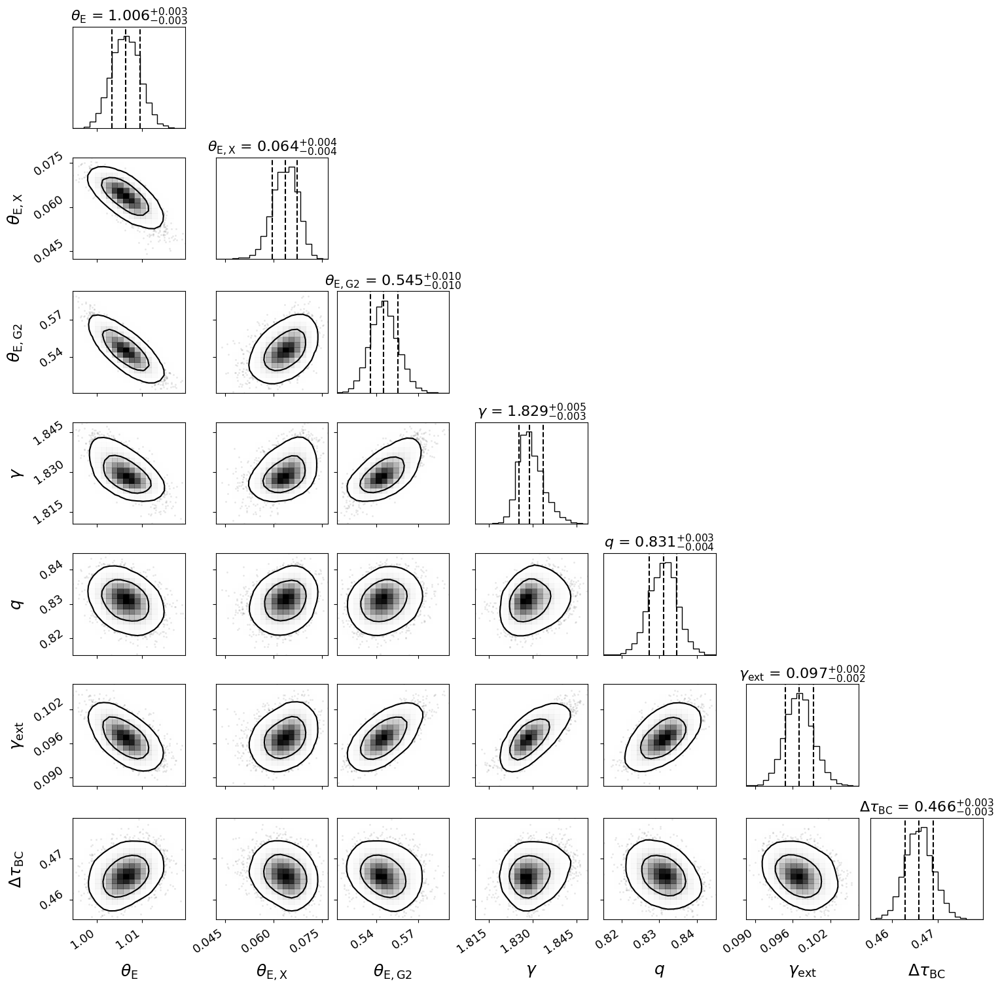

In [15]:
import numpy as np
import xarray as xr
import arviz as az
import corner
import matplotlib.pyplot as plt

post = post_with_fpd

def scalar_1d(name):
    da = post[name]
    extra_dims = [d for d in da.dims if d not in ("chain", "draw")]
    if extra_dims:
        da = da.isel({d: 0 for d in extra_dims})
    return da

def vector_component(name, i):
    da = post[name]
    vec_dim = [d for d in da.dims if d not in ("chain", "draw") and da.sizes[d] == 2][0]
    da = da.isel({vec_dim: i})
    extra_dims = [d for d in da.dims if d not in ("chain", "draw")]
    if extra_dims:
        da = da.isel({d: 0 for d in extra_dims})
    return da

# EPL ellipticity -> q and PA
e1 = vector_component("e_1", 0)
e2 = vector_component("e_1", 1)
ellip = np.sqrt(e1**2 + e2**2)
q = (1.0 - ellip) / (1.0 + ellip)
phi_mass_deg = np.rad2deg(0.5 * np.arctan2(e2, e1))
phi_mass_deg = ((phi_mass_deg + 90.0) % 180.0) - 90.0

# External shear -> strength and PA
g1 = vector_component("gamma_sheer_1", 0)
g2 = vector_component("gamma_sheer_1", 1)
gamma_ext = np.sqrt(g1**2 + g2**2)
phi_shear_deg = np.rad2deg(0.5 * np.arctan2(g2, g1))
phi_shear_deg = ((phi_shear_deg + 90.0) % 180.0) - 90.0

# Fermat-potential difference convention:
# stored fpd_34 is negative for BC, so use positive Delta tau_BC.
delta_tau_BC = -post["fpd_34"]

print("delta_tau_BC dims:", delta_tau_BC.dims)
print("delta_tau_BC shape:", delta_tau_BC.shape)
print("delta_tau_BC min / median / max:")
print(
    float(delta_tau_BC.min().values),
    float(delta_tau_BC.median().values),
    float(delta_tau_BC.max().values),
)

corner_ds = xr.Dataset(
    {
        "theta_E_1": scalar_1d("theta_E_1"),
        "theta_E_g1": scalar_1d("theta_E_g1"),
        "theta_E_g2": scalar_1d("theta_E_g2"),
        "gamma_1": scalar_1d("gamma_1"),
        "q": q,
        "gamma_ext": gamma_ext,
        "delta_tau_BC": delta_tau_BC,
        "phi_mass_deg": phi_mass_deg,
        "phi_shear_deg": phi_shear_deg,
    }
)

idata_corner = az.InferenceData(posterior=corner_ds)

print(az.summary(
    idata_corner,
    var_names=[
        "theta_E_1", "theta_E_g1", "theta_E_g2",
        "gamma_1", "q", "gamma_ext", "delta_tau_BC",
        "phi_mass_deg", "phi_shear_deg",
    ],
))

ndim = 7

fig = plt.figure(figsize=(15, 15))

fig = corner.corner(
    idata_corner.posterior,
    fig=fig,
    var_names=[
        "theta_E_1",
        "theta_E_g1",
        "theta_E_g2",
        "gamma_1",
        "q",
        "gamma_ext",
        "delta_tau_BC",
    ],
    labels=[
        r"$\theta_{\rm E}$",
        r"$\theta_{\rm E,X}$",
        r"$\theta_{\rm E,G2}$",
        r"$\gamma$",
        r"$q$",
        r"$\gamma_{\rm ext}$",
        r"$\Delta\tau_{\rm BC}$",
    ],
    show_titles=True,
    title_fmt=".3f",
    quantiles=[0.16, 0.5, 0.84],
    smooth=1.0,
    levels=[0.68, 0.95],
    max_n_ticks=3,
    labelpad=0.12,
    label_kwargs={"fontsize": 18},
    title_kwargs={"fontsize": 16},
)

axes = np.array(fig.axes).reshape((ndim, ndim))

for ax in fig.get_axes():
    ax.tick_params(axis="both", which="major", labelsize=13, pad=4)
    ax.tick_params(axis="both", which="minor", labelsize=11, pad=3)

    # Rotate tick labels slightly to avoid overlap
    for tick in ax.get_xticklabels():
        tick.set_rotation(35)
        tick.set_ha("right")

    for tick in ax.get_yticklabels():
        tick.set_rotation(35)
        tick.set_va("center")

# Move bottom x labels further down
for ax in axes[-1, :]:
    ax.xaxis.labelpad = 18

# Move left y labels further left
for ax in axes[:, 0]:
    ax.yaxis.labelpad = 18

plt.subplots_adjust(
    left=0.10,
    bottom=0.10,
    right=0.98,
    top=0.96,
    wspace=0.05,
    hspace=0.05,
)

plt.savefig("./Paper/EPL_corner.pdf", dpi=300, bbox_inches="tight")
plt.show()


In [17]:
import numpy as np
import xarray as xr
from pathlib import Path

post = post_with_fpd

# ============================================================
# Helper functions
# ============================================================
def scalar_1d(name):
    da = post[name]
    extra_dims = [d for d in da.dims if d not in ("chain", "draw")]
    if extra_dims:
        da = da.isel({d: 0 for d in extra_dims})
    return da


def vector_component(name, i):
    da = post[name]
    vec_dim = [
        d for d in da.dims
        if d not in ("chain", "draw") and da.sizes[d] == 2
    ][0]
    da = da.isel({vec_dim: i})

    extra_dims = [d for d in da.dims if d not in ("chain", "draw")]
    if extra_dims:
        da = da.isel({d: 0 for d in extra_dims})

    return da


def flatten_da(da):
    extra_dims = [d for d in da.dims if d not in ("chain", "draw")]
    if extra_dims:
        da = da.isel({d: 0 for d in extra_dims})

    arr = np.asarray(da.values).reshape(-1)
    return arr[np.isfinite(arr)]


def latex_constraint(da, ndp=3):
    arr = flatten_da(da)

    q16, q50, q84 = np.percentile(arr, [16, 50, 84])

    err_m = q50 - q16
    err_p = q84 - q50

    return rf"${q50:.{ndp}f}^{{+{err_p:.{ndp}f}}}_{{-{err_m:.{ndp}f}}}$"


# ============================================================
# Derived quantities
# ============================================================

# EPL ellipticity -> q
e1 = vector_component("e_1", 0)
e2 = vector_component("e_1", 1)

ellip = np.sqrt(e1**2 + e2**2)
q = (1.0 - ellip) / (1.0 + ellip)

# External shear -> gamma_ext
g1 = vector_component("gamma_sheer_1", 0)
g2 = vector_component("gamma_sheer_1", 1)

gamma_ext = np.sqrt(g1**2 + g2**2)

# Fermat-potential differences
delta_tau_BC  = -post["fpd_34"]
delta_tau_BA1 = -post["fpd_31"]
delta_tau_BA2 = -post["fpd_32"]


# ============================================================
# Dataset for table
# ============================================================
table_ds = xr.Dataset(
    {
        "theta_E":       scalar_1d("theta_E_1"),
        "gamma":         scalar_1d("gamma_1"),
        "q":             q,
        "gamma_ext":     gamma_ext,
        "theta_E_X":     scalar_1d("theta_E_g1"),
        "theta_E_G2":    scalar_1d("theta_E_g2"),
        "delta_tau_BC":  delta_tau_BC,
        "delta_tau_BA1": delta_tau_BA1,
        "delta_tau_BA2": delta_tau_BA2,
    }
)

param_order = [
    "theta_E",
    "gamma",
    "q",
    "gamma_ext",
    "theta_E_X",
    "theta_E_G2",
    "delta_tau_BC",
    "delta_tau_BA1",
    "delta_tau_BA2",
]

labels = {
    "theta_E":       r"$\theta_{\rm E}$",
    "gamma":         r"$\gamma$",
    "q":             r"$q$",
    "gamma_ext":     r"$\gamma_{\rm ext}$",
    "theta_E_X":     r"$\theta_{\rm E,X}$",
    "theta_E_G2":    r"$\theta_{\rm E,G2}$",
    "delta_tau_BC":  r"$\Delta\tau_{\rm BC}$",
    "delta_tau_BA1": r"$\Delta\tau_{\rm BA1}$",
    "delta_tau_BA2": r"$\Delta\tau_{\rm BA2}$",
}

decimals = {
    "theta_E":       3,
    "gamma":         3,
    "q":             3,
    "gamma_ext":     3,
    "theta_E_X":     3,
    "theta_E_G2":    3,
    "delta_tau_BC":  3,
    "delta_tau_BA1": 3,
    "delta_tau_BA2": 3,
}

values = {
    name: latex_constraint(table_ds[name], decimals[name])
    for name in param_order
}


# ============================================================
# Generate large MNRAS-style tabular
# ============================================================
colspec = "@{}" + "c" * len(param_order) + "@{}"

latex_tabular = (
    r"\begingroup" "\n"
    r"\large" "\n"
    r"\renewcommand{\arraystretch}{1.25}" "\n"
    r"\setlength{\tabcolsep}{5pt}" "\n"
    "\n"
    rf"\begin{{tabular}}{{{colspec}}}" "\n"
    r"\hline" "\n"
    + " & ".join(labels[name] for name in param_order) + r" \\" "\n"
    r"\hline" "\n"
    + " & ".join(values[name] for name in param_order) + r" \\" "\n"
    r"\hline" "\n"
    r"\end{tabular}" "\n"
    "\n"
    r"\endgroup"
)

print(latex_tabular)



\begingroup
\large
\renewcommand{\arraystretch}{1.25}
\setlength{\tabcolsep}{5pt}

\begin{tabular}{@{}ccccccccc@{}}
\hline
$\theta_{\rm E}$ & $\gamma$ & $q$ & $\gamma_{\rm ext}$ & $\theta_{\rm E,X}$ & $\theta_{\rm E,G2}$ & $\Delta\tau_{\rm BC}$ & $\Delta\tau_{\rm BA1}$ & $\Delta\tau_{\rm BA2}$ \\
\hline
$1.006^{+0.003}_{-0.003}$ & $1.829^{+0.005}_{-0.003}$ & $0.831^{+0.003}_{-0.004}$ & $0.097^{+0.002}_{-0.002}$ & $0.064^{+0.004}_{-0.004}$ & $0.545^{+0.010}_{-0.010}$ & $0.466^{+0.003}_{-0.003}$ & $0.305^{+0.004}_{-0.004}$ & $0.325^{+0.005}_{-0.005}$ \\
\hline
\end{tabular}

\endgroup


## Save lens-light-subtracted data


## Corrected-PSF Core Refitting and Five-Gaussian Export


`ftol` termination condition is satisfied.
Function evaluations 7, initial cost 4.0322e+04, final cost 3.9690e+04, first-order optimality 1.11e-01.
fit success = True
chi2/dof = 3.528038744239624
{'amp': array([126.87107673, 107.75939469, 214.76170615]), 'sigma': array([0.01904452, 0.04217237, 0.09683986]), 'e1': array([-0.14037145, -0.0578769 , -0.08466947]), 'e2': array([-0.01248935,  0.06503772,  0.11774388]), 'center_x': array([-0.002724  ,  0.00140216,  0.00030878]), 'center_y': array([-0.01424388, -0.00944529, -0.01407877])}


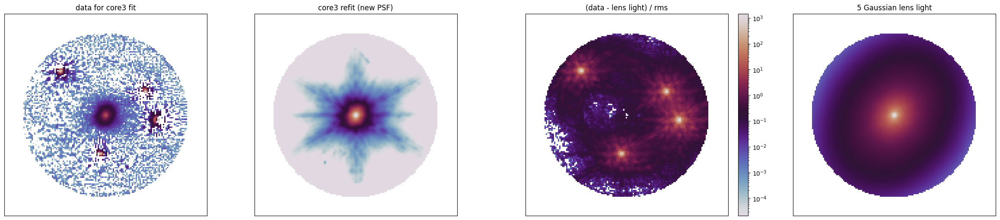

In [14]:
from scipy.optimize import least_squares

psf_core_fit = np.array(psf_corr_avg, dtype=float)
psf_core_fit = np.clip(psf_core_fit, 0.0, None)
psf_core_fit = psf_core_fit / np.sum(psf_core_fit)
model_without_core3_oldpsf = np.array(model_image_avg - fixed_lens_light_avg, dtype=float)
data_for_core_fit = np.array(data - model_without_core3_oldpsf, dtype=float)
core0 = fixed_kwargs_lens_light_first_three[0]
amp0 = np.asarray(core0['amp'], dtype=float)
sigma0 = np.asarray(core0['sigma'], dtype=float)
e10 = np.asarray(core0['e1'], dtype=float)
e20 = np.asarray(core0['e2'], dtype=float)
cx0 = np.asarray(core0['center_x'], dtype=float)
cy0 = np.asarray(core0['center_y'], dtype=float)
p0 = np.concatenate([amp0, sigma0, e10, e20, cx0, cy0])
lower = np.concatenate([0.2 * amp0, 0.6 * sigma0, np.maximum(e10 - 0.08, -0.45), np.maximum(e20 - 0.08, -0.45), cx0 - 0.08, cy0 - 0.08])
upper = np.concatenate([5.0 * amp0, 1.8 * sigma0, np.minimum(e10 + 0.08, 0.45), np.minimum(e20 + 0.08, 0.45), cx0 + 0.08, cy0 + 0.08])

def core3_model(p):
    amp, sigma, e1, e2, cx, cy = p[:3], p[3:6], p[6:9], p[9:12], p[12:15], p[15:18]
    kwargs = [{'amp': amp, 'sigma': sigma, 'e1': e1, 'e2': e2, 'center_x': cx, 'center_y': cy}]
    unconv = lens_image_pixel.lens_surface_brightness(kwargs)
    model = np.array(lens_image_pixel.ImageNumerics.re_size_convolve(unconv, unconvolved=False, psf_kernel=psf_core_fit), dtype=float)
    return model, kwargs

def resid_core3(p):
    model, _ = core3_model(p)
    return ((model - data_for_core_fit) / rms_safe).ravel()

res = least_squares(resid_core3, p0, bounds=(lower, upper), method='trf', verbose=1)
core3_refit_model, core3_refit_kwargs = core3_model(res.x)
kw_free = kwargs_avg['kwargs_lens_light'][0]
kw_core = core3_refit_kwargs[0]
kwargs_lens_light_5g = [{'amp': np.concatenate([kw_core['amp'], kw_free['amp']]), 'sigma': np.concatenate([kw_core['sigma'], kw_free['sigma']]), 'e1': np.concatenate([kw_core['e1'], kw_free['e1']]), 'e2': np.concatenate([kw_core['e2'], kw_free['e2']]), 'center_x': np.concatenate([kw_core['center_x'], kw_free['center_x']]), 'center_y': np.concatenate([kw_core['center_y'], kw_free['center_y']])}]
lens_light_total_corrected = np.array(lens_image_pixel.ImageNumerics.re_size_convolve(lens_image_pixel.lens_surface_brightness(kwargs_lens_light_5g), unconvolved=False, psf_kernel=psf_core_fit), dtype=float)
data_minus_lens_light_corrected = np.array(data - lens_light_total_corrected, dtype=np.float32)
print('fit success =', res.success)
print('chi2/dof =', np.mean(((data_for_core_fit - core3_refit_model) / rms_safe) ** 2))
print(core3_refit_kwargs[0])
fig, ax = plt.subplots(1, 4, figsize=(24, 5))
ax[0].imshow(np.ma.array(data_for_core_fit, mask=~mask_plot), origin='lower', cmap='twilight', norm='log', extent=extent, vmin=0.001)
ax[0].set_title('data for core3 fit')
ax[1].imshow(np.ma.array(core3_refit_model, mask=~mask_plot), origin='lower', cmap='twilight', norm='log', extent=extent, vmin=0.001)
ax[1].set_title('core3 refit (new PSF)')
im = ax[2].imshow(np.ma.array((data - lens_light_total_corrected), mask=~mask_plot), origin='lower', cmap='twilight', norm='log', extent=extent)
ax[2].set_title('(data - lens light) / rms')
plt.colorbar(im, ax=ax[2], fraction=0.046, pad=0.04)
ax[3].imshow(np.ma.array(lens_light_total_corrected, mask=~mask_plot), origin='lower', cmap='twilight', norm='log', extent=extent, vmin=0.001)
ax[3].set_title('5 Gaussian lens light')
for a in ax:
    a.set_xticks([])
    a.set_yticks([])
plt.show()


In [15]:
# SAVE_DIR = products_root
# SAVE_DIR.mkdir(parents=True, exist_ok=True)
# kw5 = kwargs_lens_light_5g[0]
# fiveg_path = SAVE_DIR / f'fixed_five_gaussians_corrected_psf{suffix}.npz'
# np.savez(fiveg_path, amp=np.asarray(kw5['amp'], dtype=float), sigma=np.asarray(kw5['sigma'], dtype=float), e1=np.asarray(kw5['e1'], dtype=float), e2=np.asarray(kw5['e2'], dtype=float), center_x=np.asarray(kw5['center_x'], dtype=float), center_y=np.asarray(kw5['center_y'], dtype=float))
# new_subtracted_path = SAVE_DIR / f'data_minus_lens_light_corrected_psf{suffix}.fits'
# fits.writeto(new_subtracted_path, data_minus_lens_light_corrected, overwrite=True)
# print('saved:', fiveg_path)
# print('saved:', new_subtracted_path)


saved: result/result_ss=2_fullconcen_light_multimass_20260427_14/fixed_five_gaussians_corrected_psf_ss=2_fullconcen_light_multimass.npz
saved: result/result_ss=2_fullconcen_light_multimass_20260427_14/data_minus_lens_light_corrected_psf_ss=2_fullconcen_light_multimass.fits


In [16]:
# SAVE_DIR = products_root
# SAVE_DIR.mkdir(parents=True, exist_ok=True)

# lens_light_subtracted_data = np.array(data - lens_light_avg, dtype=np.float32)
# lens_light_subtracted_path = SAVE_DIR / f'data_minus_lens_light{suffix}.fits'
# fits.writeto(lens_light_subtracted_path, lens_light_subtracted_data, overwrite=True)
# print('Saved lens-light-subtracted data to:', lens_light_subtracted_path)


Saved lens-light-subtracted data to: result/result_ss=2_fullconcen_light_multimass_20260427_14/data_minus_lens_light_ss=2_fullconcen_light_multimass.fits


## Preview saved lens-light-subtracted data


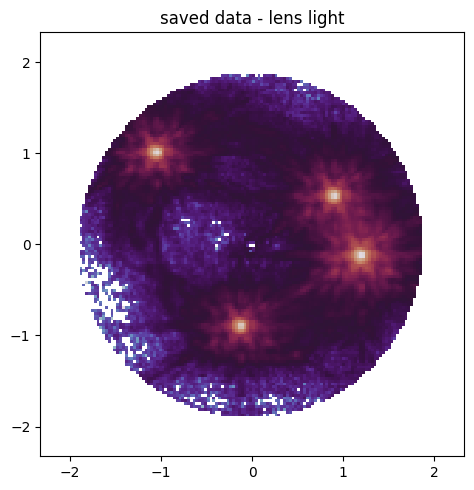

Lens-light-subtracted FITS path: result/result_ss=2_fullconcen_light_multimass_20260427_14/data_minus_lens_light_ss=2_fullconcen_light_multimass.fits


In [17]:
# fig, ax = plt.subplots(1, 1, figsize=(6, 5))
# ax.imshow(
#     np.ma.array(lens_light_subtracted_data, mask=~mask_plot),
#     norm='log',
#     cmap='twilight',
#     origin='lower',
#     extent=extent,
# )
# ax.set_title('saved data - lens light')
# plt.tight_layout()
# plt.show()

# print('Lens-light-subtracted FITS path:', lens_light_subtracted_path)


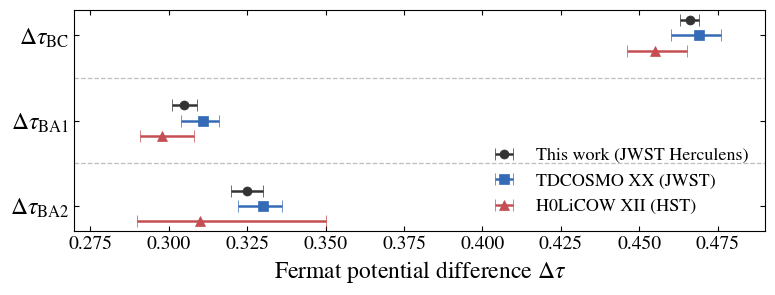

In [6]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

out = Path("./Paper/fermat_potential_errorbar_comparison.pdf")

params = [r"$\Delta\tau_{\rm BC}$", r"$\Delta\tau_{\rm BA1}$", r"$\Delta\tau_{\rm BA2}$"]
y = np.arange(len(params))

series = {
    "This work (JWST Herculens)": {
        "x": np.array([0.466, 0.305, 0.325]),
        "lo": np.array([0.003, 0.004, 0.005]),
        "hi": np.array([0.003, 0.004, 0.005]),
        "color": "#333333",
        "marker": "o",
        "offset": -0.18,
    },
    "TDCOSMO XX (JWST)": {
        "x": np.array([0.469, 0.311, 0.330]),
        "lo": np.array([0.009, 0.007, 0.008]),
        "hi": np.array([0.007, 0.005, 0.006]),
        "color": "#356ab7",
        "marker": "s",
        "offset": 0.00,
    },
    "H0LiCOW XII (HST)": {
        "x": np.array([0.455, 0.298, 0.310]),
        "lo": np.array([0.009, 0.007, 0.020]),
        "hi": np.array([0.010, 0.010, 0.040]),
        "color": "#c44e52",
        "marker": "^",
        "offset": 0.18,
    },
}

plt.rcParams.update({
    "font.size": 15,
    "axes.labelsize": 17,
    "xtick.labelsize": 14,
    "ytick.labelsize": 17,
    "legend.fontsize": 13,
    "mathtext.fontset": "stix",
    "font.family": "STIXGeneral",
})

fig, ax = plt.subplots(figsize=(8, 3.2))

for label, cfg in series.items():
    ax.errorbar(
        cfg["x"], y + cfg["offset"],
        xerr=np.vstack([cfg["lo"], cfg["hi"]]),
        fmt=cfg["marker"],
        color=cfg["color"],
        ecolor=cfg["color"],
        elinewidth=1.8,
        capsize=4.0,
        markersize=6.5,
        markeredgewidth=0.5,
        label=label,
        zorder=3,
    )

ax.set_yticks(y)
ax.set_yticklabels(params)

for y_sep in np.arange(len(params) - 1) + 0.5:
    ax.axhline(y_sep, color="0.75", linestyle="--", linewidth=0.9, zorder=0)

ax.invert_yaxis()
ax.set_xlabel(r"Fermat potential difference $\Delta\tau$")
ax.tick_params(axis="both", which="both", direction="in", top=True, right=True)
ax.legend(loc="lower right", frameon=False)
ax.set_xlim(0.27, 0.49)

fig.tight_layout()
fig.savefig(out, dpi=300, bbox_inches="tight")
plt.show()